# Predicting Attrition in an Organization

### Importing the libraries

In [1]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [2]:
import pandas as pd
import numpy as np
try:
    import pandas_profiling
except:
    !pip install pandas_profiling
    import pandas_profiling

from dateutil import relativedelta
from datetime import date
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Reading the dataset

In [3]:
df = pd.read_csv("Final dataset Attrition.csv")

In [4]:
print(df.shape)
print(df.columns)
df.head(5)

(1470, 33)
Index(['Age', 'Attrition', 'BusinessTravel', 'Department', 'DistanceFromHome',
       'Gender', 'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Higher_Education',
       'Date_of_Hire', 'Date_of_termination', 'Status_of_leaving',
       'Mode_of_work', 'Leaves', 'Absenteeism', 'Work_accident',
       'Source_of_Hire', 'Job_mode', 'Unnamed: 32'],
      dtype='object')


,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Gender,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,Higher_Education,Date_of_Hire,Date_of_termination,Status_of_leaving,Mode_of_work,Leaves,Absenteeism,Work_accident,Source_of_Hire,Job_mode,Unnamed: 32
0,37,Yes,Travel_Rarely,Research & Development,2,Male,2,1,Laboratory Technician,3,Single,2090,6,Yes,15,3,0,7,3,0,0,0,Graduation,21-01-2021,NaN,Salary,OFFICE,4,2,No,Job Event,Contract,NaN
1,21,No,Travel_Rarely,Research & Development,15,Male,3,1,Research Scientist,4,Single,1232,1,No,14,3,0,0,6,0,0,0,Graduation,13-03-2021,NaN,Work Accident,WFH,5,2,No,Recruiter,Part Time,NaN
2,45,No,Travel_Rarely,Research & Development,6,Male,3,3,Research Director,1,Married,13245,4,Yes,14,3,0,17,3,0,0,0,Post-Graduation,23-01-2021,NaN,Dept.Head,WFH,1,3,No,Job Event,Contract,NaN
3,23,No,Travel_Rarely,Sales,2,Male,3,1,Sales Representative,1,Divorced,2322,3,No,13,3,1,3,3,0,0,0,PHD,25-04-2021,NaN,Work Accident,OFFICE,1,0,Yes,Recruiter,FullTime,NaN
4,22,No,Travel_Rarely,Research & Development,15,Female,3,1,Laboratory Technician,4,Single,2871,1,No,15,3,0,1,5,0,0,0,PHD,14-06-2021,NaN,Better Opportunity,WFH,5,2,No,Job Event,Contract,NaN


### Checking the data

In [5]:
# checking the data types of columns
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
Department                  object
DistanceFromHome             int64
Gender                      object
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
YearsAtCompany               int64
YearsSinceLastPromotion      int64
YearsWithCurrManager         int64
Higher_Education            object
Date_of_Hire                object
Date_of_termination        float64
Status_of_leaving           object
Mode_of_work                object
Leaves                       int64
Absenteeism         

In [6]:
# describing the data - numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.0,36.0,43.0,60.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.0,7.0,14.0,29.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.0,3.0,3.0,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.0,2.0,3.0,5.0
JobSatisfaction,1470.0,2.728571,1.102846,1.0,2.0,3.0,4.0,4.0
MonthlyIncome,1470.0,6502.931293,4707.956783,1009.0,2911.0,4919.0,8379.0,19999.0
NumCompaniesWorked,1470.0,2.693197,2.498009,0.0,1.0,2.0,4.0,9.0
PercentSalaryHike,1470.0,15.209524,3.659938,11.0,12.0,14.0,18.0,25.0
PerformanceRating,1470.0,3.153741,0.360824,3.0,3.0,3.0,3.0,4.0
StockOptionLevel,1470.0,0.793878,0.852077,0.0,0.0,1.0,1.0,3.0


In [7]:
# describing the data - categorical columns
df.describe(include='object').T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
Gender,1470,2,Male,882
JobRole,1470,9,Sales Executive,326
MaritalStatus,1470,3,Married,673
OverTime,1470,2,No,1054
Higher_Education,1470,4,Post-Graduation,387
Date_of_Hire,1470,1112,17-02-2016,5
Status_of_leaving,1470,5,Dept.Head,314


In [8]:
#checking if there are any NaN values in the columns
df.isna().sum()

Age                           0
Attrition                     0
BusinessTravel                0
Department                    0
DistanceFromHome              0
Gender                        0
JobInvolvement                0
JobLevel                      0
JobRole                       0
JobSatisfaction               0
MaritalStatus                 0
MonthlyIncome                 0
NumCompaniesWorked            0
OverTime                      0
PercentSalaryHike             0
PerformanceRating             0
StockOptionLevel              0
TotalWorkingYears             0
TrainingTimesLastYear         0
YearsAtCompany                0
YearsSinceLastPromotion       0
YearsWithCurrManager          0
Higher_Education              0
Date_of_Hire                  0
Date_of_termination        1470
Status_of_leaving             0
Mode_of_work                  0
Leaves                        0
Absenteeism                   0
Work_accident                 0
Source_of_Hire                0
Job_mode

We can see that the Date_of_termination and Unnamed: 32 column have NaN valus and the count of them is equal to the total number of rows in the dataset. Hence, we are dropping the columns as they are completely blank. Also we are dropping the column Date_of_Hire as we don't find the dates of much use here.

In [9]:
# dropping the unwanted columns
df.drop(columns=['Date_of_termination', 'Unnamed: 32', 'Date_of_Hire'], inplace=True)
df.shape

(1470, 30)

In [10]:
# checking the count of attrition values
df.Attrition.value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [11]:
# checking the percentage distribution of attrition values
np.round(df.Attrition.value_counts(normalize=True)*100, 2)

No     83.88
Yes    16.12
Name: Attrition, dtype: float64

Since the Attrition rate (% of Attrition = Yes) is very low in our dataset, we consider the data as skewed class proportioned and imbalanced.

## Exploring the data - performing EDA

In [12]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Univariate analysis

In [13]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)


Column name : Attrition


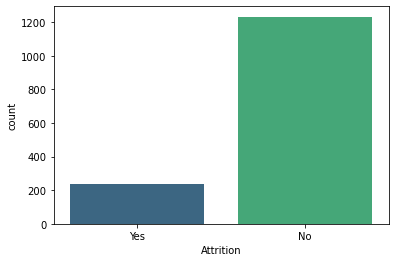


Column name : BusinessTravel


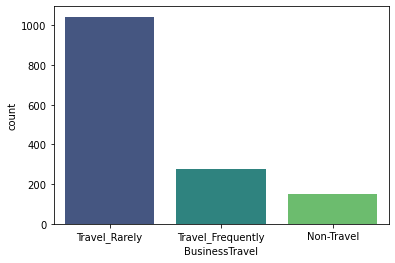


Column name : Department


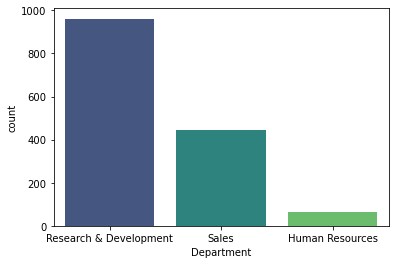


Column name : Gender


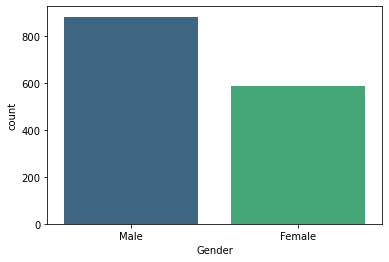


Column name : JobRole


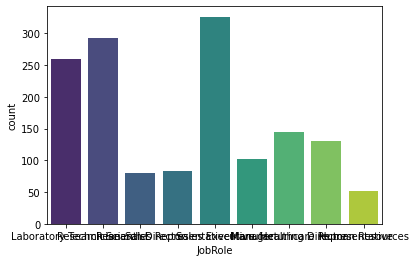


Column name : MaritalStatus


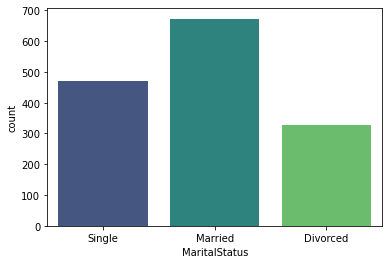


Column name : OverTime


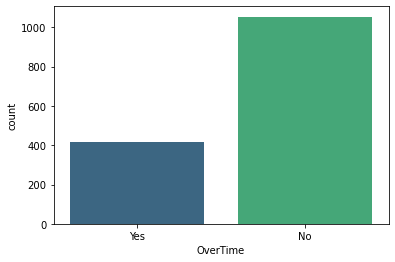


Column name : Higher_Education


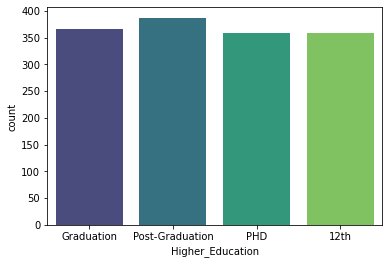


Column name : Status_of_leaving


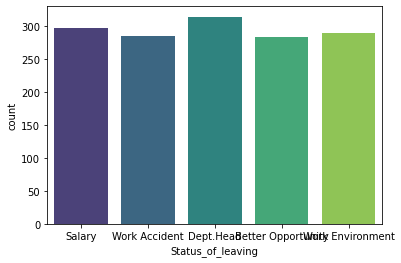


Column name : Mode_of_work


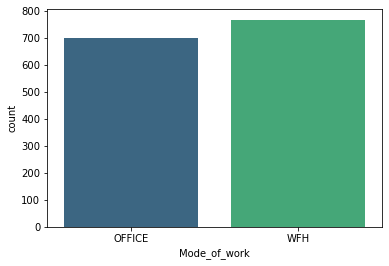


Column name : Work_accident


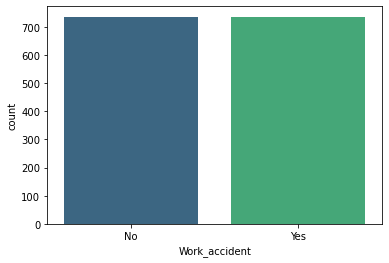


Column name : Source_of_Hire


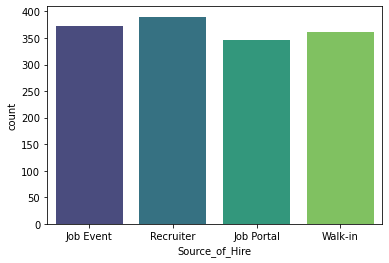


Column name : Job_mode


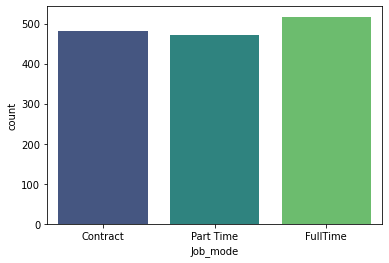

In [14]:
# plotting the univariate graphs for all the categorical columns
for i in list(df.describe(include='object').columns):
    print('\nColumn name : {}'.format(i))
    sns.countplot(df[i], palette="viridis")
    plt.show()


Column name : Age


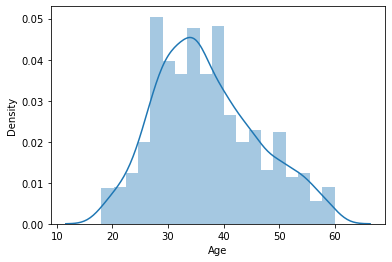


Column name : DistanceFromHome


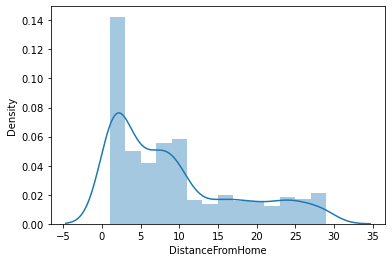


Column name : JobInvolvement


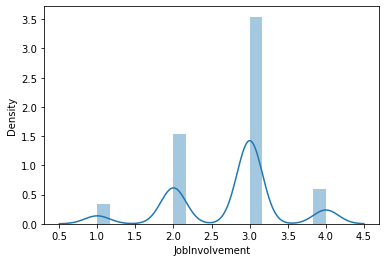


Column name : JobLevel


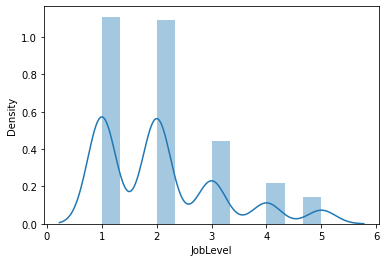


Column name : JobSatisfaction


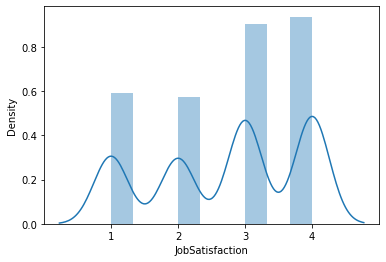


Column name : MonthlyIncome


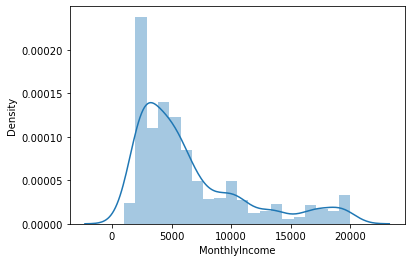


Column name : NumCompaniesWorked


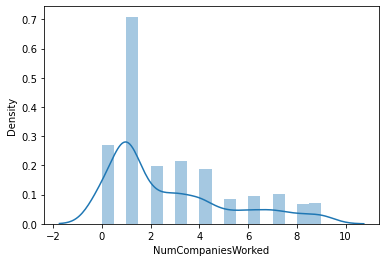


Column name : PercentSalaryHike


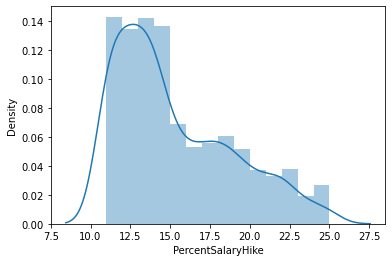


Column name : PerformanceRating


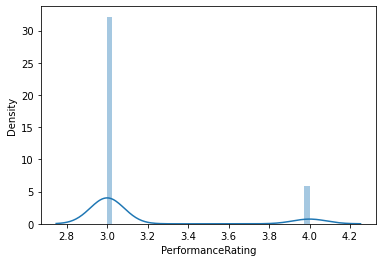


Column name : StockOptionLevel


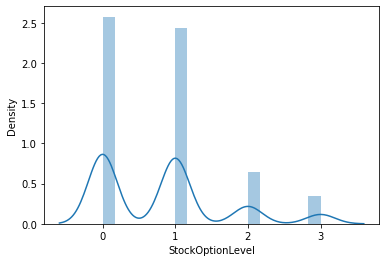


Column name : TotalWorkingYears


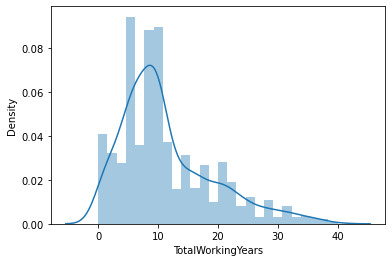


Column name : TrainingTimesLastYear


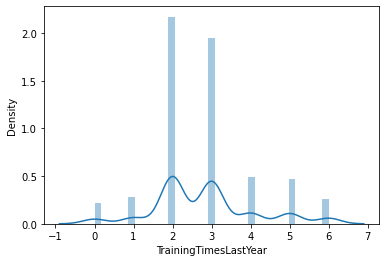


Column name : YearsAtCompany


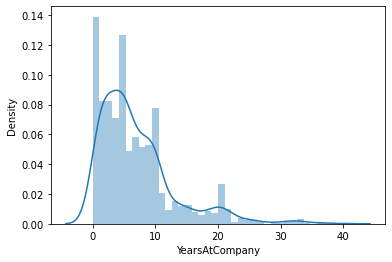


Column name : YearsSinceLastPromotion


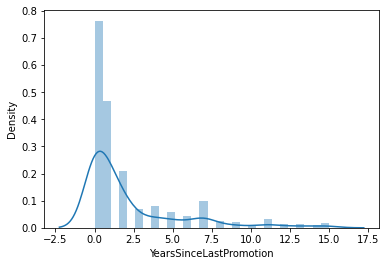


Column name : YearsWithCurrManager


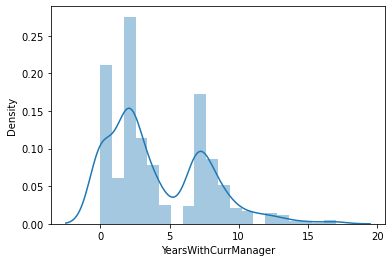


Column name : Leaves


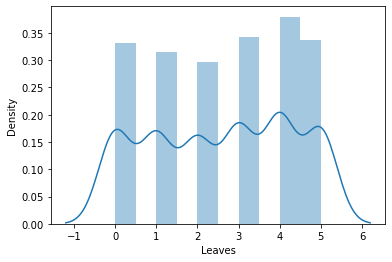


Column name : Absenteeism


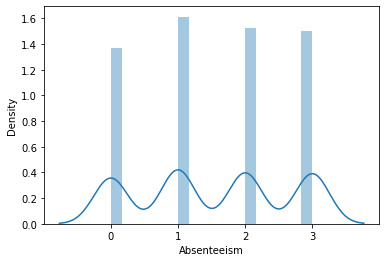

In [15]:
# plotting the univariate graphs for all the numerical columns
for i in list(df.describe(include='int').columns):
    print('\nColumn name : {}'.format(i))
    sns.distplot(df[i])
    plt.show()

### Bivariate analysis

In [16]:
# generating lists of the numerical columns and numeric columns
target_col = 'Attrition'
list_cat_col = [x for x in list(df.describe(include='object').columns) if x !=  target_col]
list_num_col = [x for x in list(df.describe(include='int').columns) if x != target_col]

print("Number of categorical columns: ",len(list_cat_col))
print("Number of numerical columns:   ",len(list_num_col))
print("Total number of columns:       ",len(df.columns))

Number of categorical columns:  12
Number of numerical columns:    17
Total number of columns:        30



Column name : BusinessTravel


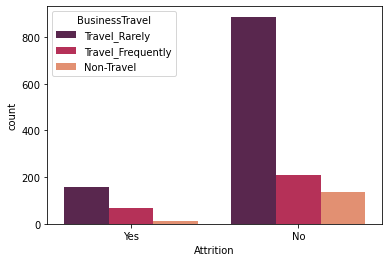


Column name : Department


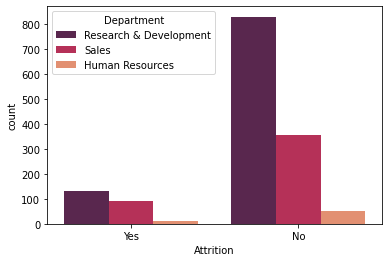


Column name : Gender


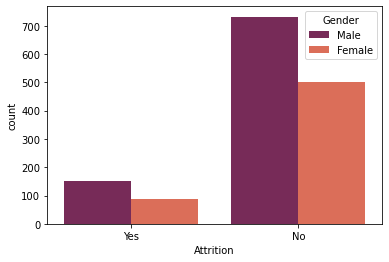


Column name : JobRole


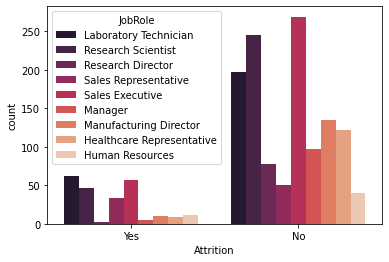


Column name : MaritalStatus


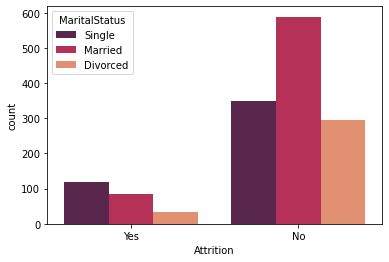


Column name : OverTime


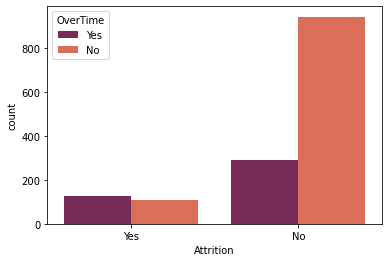


Column name : Higher_Education


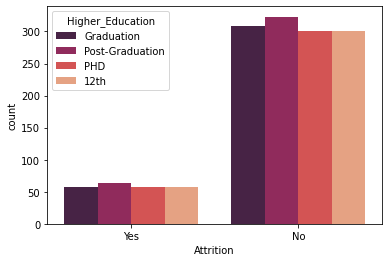


Column name : Status_of_leaving


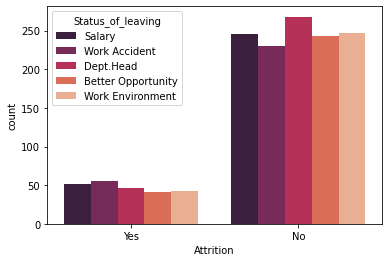


Column name : Mode_of_work


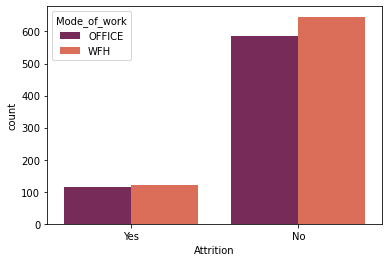


Column name : Work_accident


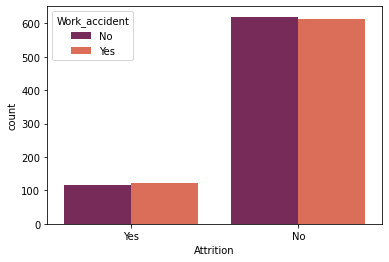


Column name : Source_of_Hire


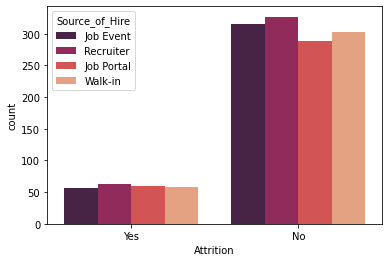


Column name : Job_mode


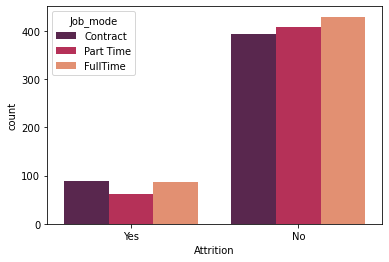

In [17]:
# plotting graphs with different columns based on Attrition value
for i in list_cat_col:
    print('\nColumn name : {}'.format(i))
    sns.countplot(data=df, x=target_col, hue=i, palette="rocket")
    plt.show()

<AxesSubplot:xlabel='OverTime', ylabel='count'>

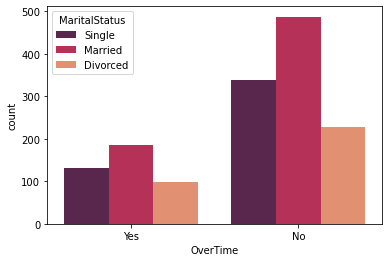

In [18]:
sns.countplot(data=df, x='OverTime', hue='MaritalStatus',  palette="rocket")

# Check correlation

In [19]:
corr = df[list_num_col].corr()

In [20]:
corr.style.background_gradient(cmap ='coolwarm')

,Age,DistanceFromHome,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,Leaves,Absenteeism
Age,1.000000,-0.001686,0.029820,0.509604,-0.004892,0.497855,0.299635,0.003634,0.001904,0.037510,0.680381,-0.019621,0.311309,0.216513,0.202089,0.033811,-0.004628
DistanceFromHome,-0.001686,1.000000,0.008783,0.005303,-0.003669,-0.017014,-0.029251,0.040235,0.027110,0.044872,0.004628,-0.036942,0.009508,0.010029,0.014406,-0.022749,0.024581
JobInvolvement,0.029820,0.008783,1.000000,-0.012630,-0.021476,-0.015271,0.015012,-0.017205,-0.029071,0.021523,-0.005533,-0.015338,-0.021355,-0.024184,0.025976,0.016599,-0.000442
JobLevel,0.509604,0.005303,-0.012630,1.000000,-0.001944,0.950300,0.142501,-0.034730,-0.021222,0.013984,0.782208,-0.018191,0.534739,0.353885,0.375281,0.028144,-0.013089
JobSatisfaction,-0.004892,-0.003669,-0.021476,-0.001944,1.000000,-0.007157,-0.055699,0.020002,0.002297,0.010690,-0.020185,-0.005779,-0.003803,-0.018214,-0.027656,-0.044989,-0.027244
MonthlyIncome,0.497855,-0.017014,-0.015271,0.950300,-0.007157,1.000000,0.149515,-0.027269,-0.017120,0.005408,0.772893,-0.021736,0.514285,0.344978,0.344079,0.002569,-0.018816
NumCompaniesWorked,0.299635,-0.029251,0.015012,0.142501,-0.055699,0.149515,1.000000,-0.010238,-0.014095,0.030075,0.237639,-0.066054,-0.118421,-0.036814,-0.110319,0.019291,-0.010462
PercentSalaryHike,0.003634,0.040235,-0.017205,-0.034730,0.020002,-0.027269,-0.010238,1.000000,0.773550,0.007528,-0.020608,-0.005221,-0.035991,-0.022154,-0.011985,-0.005762,-0.005041
PerformanceRating,0.001904,0.027110,-0.029071,-0.021222,0.002297,-0.017120,-0.014095,0.773550,1.000000,0.003506,0.006744,-0.015579,0.003435,0.017896,0.022827,-0.006077,-0.014931
StockOptionLevel,0.037510,0.044872,0.021523,0.013984,0.010690,0.005408,0.030075,0.007528,0.003506,1.000000,0.010136,0.011274,0.015058,0.014352,0.024698,0.014579,0.020468


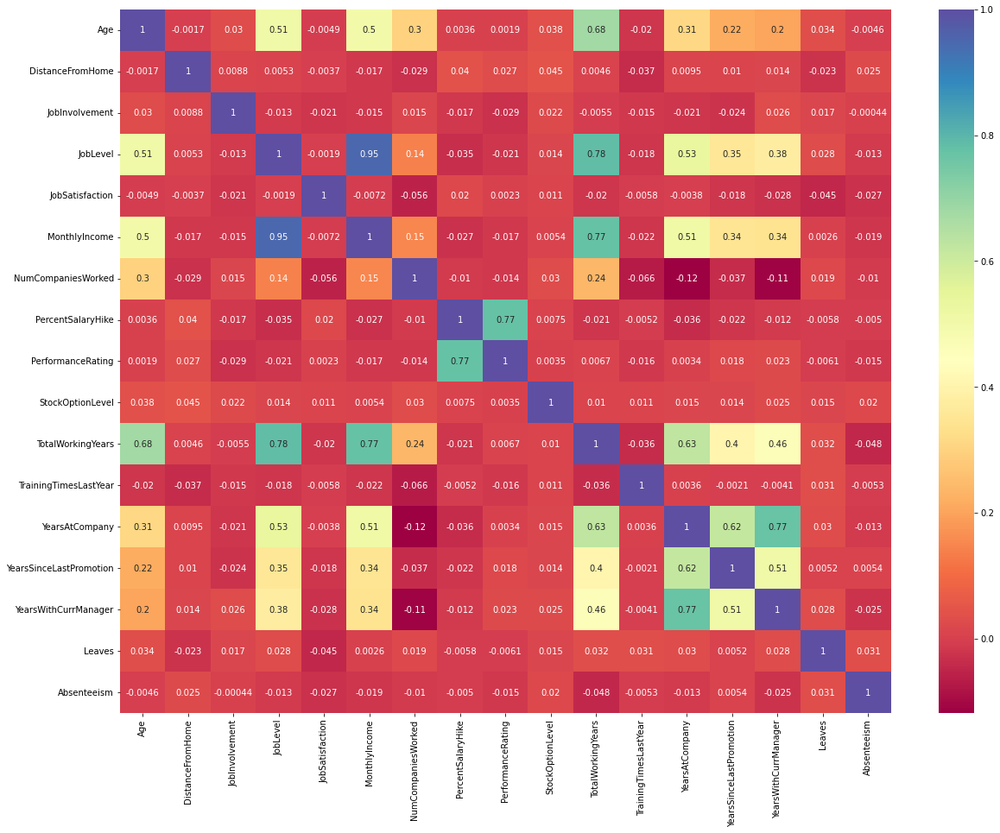

In [21]:
plt.subplots(figsize=(20,15))
sns.heatmap(corr, annot=True, cmap="Spectral");

# Data readiness before model building

## Scaling numeric data

In [22]:
df1 = df.copy()

In [23]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [24]:
scaler = MinMaxScaler()

In [25]:
df1[list_num_col] = pd.DataFrame(scaler.fit_transform(df1[list_num_col]))

## Encoding categorical data

In [26]:
df.BusinessTravel.value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

In [27]:
list_label_enc = ['BusinessTravel']
list_onehot_enc = [x for x in list_cat_col if x not in list_label_enc]
len(list_label_enc), len(list_onehot_enc), len(list_cat_col)

(1, 11, 12)

In [28]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

In [29]:
df.Mode_of_work.value_counts()

WFH       768
OFFICE    702
Name: Mode_of_work, dtype: int64

In [30]:
enc_label = LabelEncoder()
for i in list_label_enc:
    df1[i] = enc_label.fit_transform(df1[i])

In [31]:
import regex

In [32]:
for i in list_onehot_enc:
    df1[i] = df1[i].replace('[^a-zA-Z]', '', regex=True)

In [33]:
df1 = pd.get_dummies(df1, columns=list_onehot_enc, drop_first=True)

In [34]:
df1.head(2)

,Age,Attrition,BusinessTravel,DistanceFromHome,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,Leaves,Absenteeism,Department_ResearchDevelopment,Department_Sales,Gender_Male,JobRole_HumanResources,JobRole_LaboratoryTechnician,JobRole_Manager,JobRole_ManufacturingDirector,JobRole_ResearchDirector,JobRole_ResearchScientist,JobRole_SalesExecutive,JobRole_SalesRepresentative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes,Higher_Education_PHD,Higher_Education_PostGraduation,Higher_Education_th,Status_of_leaving_DeptHead,Status_of_leaving_Salary,Status_of_leaving_WorkAccident,Status_of_leaving_WorkEnvironment,Mode_of_work_WFH,Work_accident_Yes,Source_of_Hire_JobPortal,Source_of_Hire_Recruiter,Source_of_Hire_Walkin,Job_mode_FullTime,Job_mode_PartTime
0,0.452381,Yes,2,0.035714,0.333333,0.0,0.666667,0.056925,0.666667,0.285714,0.0,0.0,0.175,0.5,0.0,0.0,0.0,0.8,0.666667,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,0.071429,No,2,0.500000,0.666667,0.0,1.000000,0.011743,0.111111,0.214286,0.0,0.0,0.000,1.0,0.0,0.0,0.0,1.0,0.666667,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1


# Label encoding target variable

In [35]:
df1.Attrition = enc_label.fit_transform(df1.Attrition)

In [36]:
df1.Attrition.value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

# Train test split

In [37]:
from sklearn.model_selection import train_test_split

In [38]:
list_feat_train = [x for x in df1.columns if x != target_col]
len(list_feat_train)

46

In [39]:
X_train, X_test, y_train, y_test = train_test_split(df1[list_feat_train], df1.Attrition, random_state=123, stratify=df1.Attrition)

# Model Building

In [40]:
from sklearn.metrics import classification_report, f1_score, accuracy_score

## Classification Algorithms

## Logisitic regression

In [41]:
from sklearn.linear_model import LogisticRegression

In [42]:
lr = LogisticRegression()
lr.fit(X_train, y_train)

LogisticRegression()

In [43]:
pred = lr.predict(X_test)

In [44]:
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       0.96      0.87      0.92       341
           1       0.27      0.59      0.37        27

    accuracy                           0.85       368
   macro avg       0.62      0.73      0.64       368
weighted avg       0.91      0.85      0.88       368



In [45]:
pd.crosstab(pred, y_test)

Attrition,0,1
row_0,,
0,298,43
1,11,16


From the classification using Logistic regression algorithm, we got the attrition precision value as 0.27 which is 27% accuray.

## Random Forest

In [46]:
from sklearn.ensemble import RandomForestClassifier

In [47]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [48]:
pred_rf = rf.predict(X_test)

In [49]:
print(classification_report(pred_rf, y_test))

              precision    recall  f1-score   support

           0       0.98      0.86      0.91       353
           1       0.14      0.53      0.22        15

    accuracy                           0.84       368
   macro avg       0.56      0.69      0.56       368
weighted avg       0.94      0.84      0.88       368



In [51]:
pd.crosstab(pred, y_test)

Attrition,0,1
row_0,,
0,298,43
1,11,16


#### From the classification using Random Forest algorithm, we got the attrition precision value as 0.14 which is 14% accuray.

## Decision Tree 

In [52]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

In [53]:
dtc.fit(X_train, y_train)
pred = dtc.predict(X_test)

In [54]:
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       0.87      0.85      0.86       317
           1       0.17      0.20      0.18        51

    accuracy                           0.76       368
   macro avg       0.52      0.52      0.52       368
weighted avg       0.77      0.76      0.76       368



In [56]:
pd.crosstab(pred, y_test)

Attrition,0,1
row_0,,
0,268,49
1,41,10


From the classification using Decision Tree algorithm, we got the attrition precision value as 0.17 which is 17% accuray.

##  Support Vector Machine (SVM)
 

In [57]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(X_train, y_train)
pred = svc.predict(X_test)

In [58]:
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       0.99      0.85      0.91       362
           1       0.05      0.50      0.09         6

    accuracy                           0.84       368
   macro avg       0.52      0.67      0.50       368
weighted avg       0.97      0.84      0.90       368



From the classification using SVM algorithm, we got the attrition precision value as 0.05 which is 5% accuray.

## K-Nearest Neighbour (KNN)
 

In [59]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
pred = knn.predict(X_test)

In [60]:
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       0.96      0.86      0.91       347
           1       0.15      0.43      0.23        21

    accuracy                           0.83       368
   macro avg       0.56      0.64      0.57       368
weighted avg       0.92      0.83      0.87       368



From the classification using K-Nearest Neighbour algorithm, we got the attrition precision value as 0.15 which is 15% accuray.

## Naive Bayes 

In [61]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)
pred = gnb.predict(X_test)

In [62]:
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       0.52      0.91      0.67       178
           1       0.73      0.23      0.35       190

    accuracy                           0.56       368
   macro avg       0.63      0.57      0.51       368
weighted avg       0.63      0.56      0.50       368



In [63]:
pd.crosstab(pred, y_test)

Attrition,0,1
row_0,,
0,162,16
1,147,43


In [64]:
TP = 43
TN = 162
FP = 16
FN = 147

In [65]:
Precision = TP/(TP+FP)
Precision

0.7288135593220338

In [66]:
print("Naive Bayes score: ",gnb.score(X_test, y_test))

Naive Bayes score:  0.5570652173913043


From the classification using Naive Bayes algorithm, we got the attrition precision value as 0.72 and Naive Bayes Score as 0.55.

## XGBoost

In [68]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable


In [69]:
from xgboost import XGBClassifier

In [70]:
xgb = XGBClassifier(scale_pos_weight=0.4)

In [71]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [72]:
pred_xgb = xgb.predict(X_test)

In [73]:
print(classification_report(pred_xgb, y_test))

              precision    recall  f1-score   support

           0       0.96      0.87      0.91       342
           1       0.22      0.50      0.31        26

    accuracy                           0.84       368
   macro avg       0.59      0.68      0.61       368
weighted avg       0.91      0.84      0.87       368



From the classification using Decision Tree algorithm, we got the attrition precision value as 0.22 which is 22% accuray.

## Selection of Algorithm

After analysing multiple classification algorithms on our dataset, we got the highest accuracy percentage with Naive Bayes algorithm. Hence we'll choose Naive Bayes as the classification algorithm for our problem.